# Using Other APIs with RoutingPy - Valhalla

The Valhalla API is a free and open source routing engine that works with OpenStreetMap data.

Like the previous API we used, we can also pull back both travel matrices and isochrones.

It can both be run locally, or the free web-based instance can be accessed.

In [1]:
import routingpy as rp
import geopandas
import contextily as cx
import matplotlib.pyplot as plt
from shapely.geometry import Polygon

Experiment with a simple isochrone

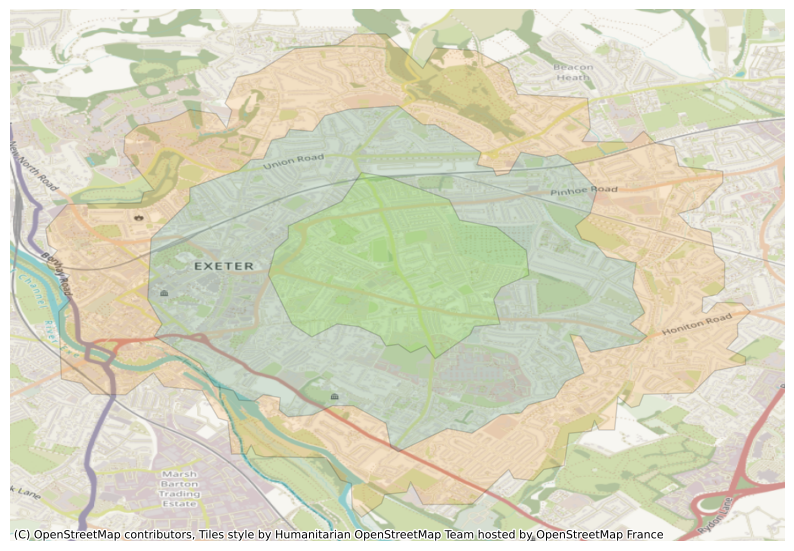

In [2]:
valhalla_api = rp.Valhalla(base_url='https://valhalla1.openstreetmap.de')

isochrone = valhalla_api.isochrones(
    locations=[-3.5127907292783873,50.72593717697725], # note long lat, not lat long
    profile="multimodal", # this is transit + pedestrian mix
    intervals=[10*60,20*60,30*60] # in seconds, so 10 * 60 = 10 minutes, etc.
)

# set colours to iterate through (from longest time to shortest)
color_list = ["darkorange", "deepskyblue", "chartreuse"]

fig, ax = plt.subplots(figsize=(10,10))

number_of_isochrones = len(isochrone)

for i in range(len(isochrone)):
    lon_lat_list = isochrone[number_of_isochrones-i-1].geometry # this improves order isochrones are plotted in

    polygon_geom = Polygon(lon_lat_list)
    polygon = geopandas.GeoDataFrame(index=[0], crs='epsg:4326', geometry=[polygon_geom])

    polygon.plot(ax=ax, alpha=0.15, edgecolor='black', color=color_list[i])

ax.axis('off')

cx.add_basemap(ax,zoom=14, crs=polygon.crs.to_string())

Turn this into an easy function for creating an isochrone from any lat-long pair.

In [3]:
def get_isochrone(long_lat_pair, profile="auto", intervals=[10*60,20*60,30*60], basemap_zoom=12, figsize=(10,10), alpha=0.15, options_dict=None):
    '''
    locations – One pair of lng/lat values. Takes the form [Longitude, Latitude].

    profile – Specifies the mode of transport to use when calculating directions. One of [“auto”, “bicycle”, “multimodal”, “pedestrian”.

    intervals – Time ranges to calculate isochrones for. In seconds or meters, depending on interval_type.
    '''
    valhalla_api = rp.Valhalla(base_url='https://valhalla1.openstreetmap.de')

    isochrone = valhalla_api.isochrones(
        locations=long_lat_pair,
        profile=profile,
        intervals=intervals,
        options=options_dict
    )

    color_list = ["darkorange", "deepskyblue", "chartreuse"]

    fig, ax = plt.subplots(figsize=figsize)

    number_of_isochrones = len(isochrone)

    for i in range(len(isochrone)):
        lon_lat_list = isochrone[number_of_isochrones-i-1].geometry

        polygon_geom = Polygon(lon_lat_list)
        polygon = geopandas.GeoDataFrame(index=[0], crs='epsg:4326', geometry=[polygon_geom])

        polygon.plot(ax=ax, alpha=alpha, edgecolor='black', color=color_list[i])

    ax.axis('off')

    cx.add_basemap(ax,zoom=basemap_zoom, crs=polygon.crs.to_string())


## Car

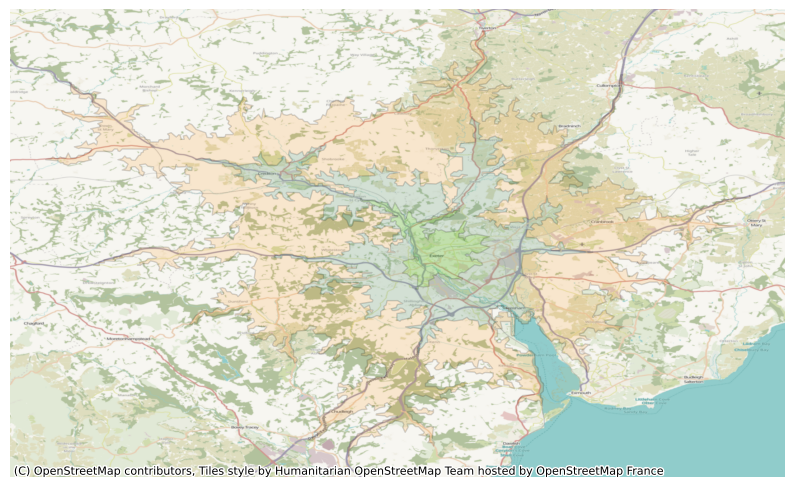

In [4]:
# auto = car in this api, not 'automatic' choice of routing

get_isochrone(
    long_lat_pair= [-3.5280937949744335,50.72494617349739],
    profile="auto",
    basemap_zoom=12
    )

Valhalla instances can have traffic data integrated into it - though only for 'routes' and isochrones, and seemingly not via their web service (i.e. it has to be done with a local Valhalla instance).

In [ ]:
get_isochrone(
    long_lat_pair= [-3.5280937949744335,50.72494617349739],
    profile="auto",
    basemap_zoom=12
    )

## Bicycle

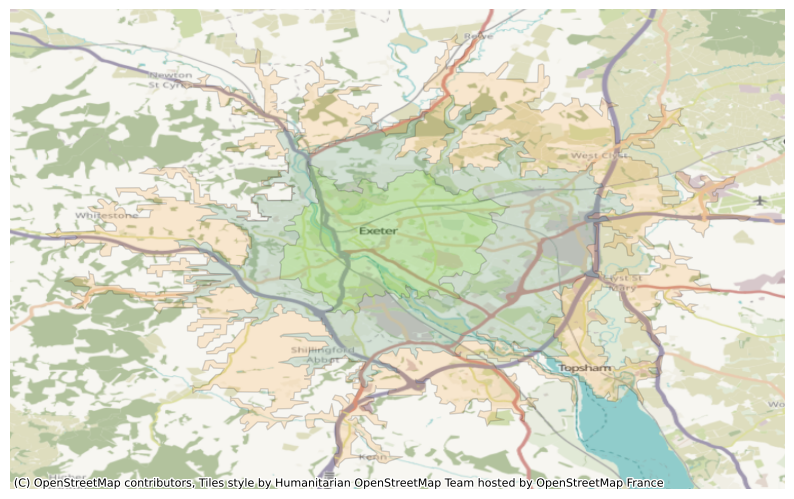

In [5]:
# bike

get_isochrone(
    long_lat_pair= [-3.5280937949744335,50.72494617349739],
    profile="bicycle",
    basemap_zoom=12
    )

## Public Transit

Some level of public transport service seemes to be available in the service.

It appears that [it may be through a partnership](https://gis-ops.com/routing-and-optimisation/#data-services) with [Transitland](https://www.transit.land/): see https://www.transit.land/places/United%20Kingdom

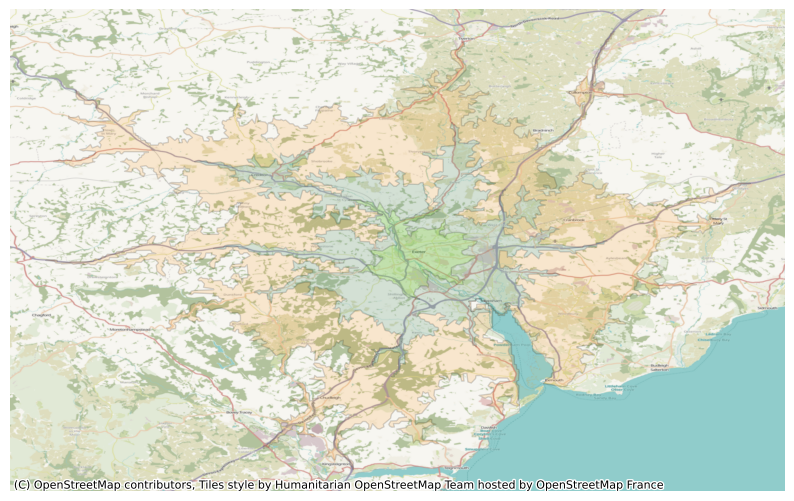

In [6]:
# 'bus' profile doesn't appear to work correctly - repeats car map
# same seems to be true on their demo site (https://valhalla.openstreetmap.de/)
# use 'multimodal' instead for public transport - see below

get_isochrone(
    long_lat_pair= [-3.5280937949744335,50.72494617349739],
    profile="bus",
    basemap_zoom=12
    )

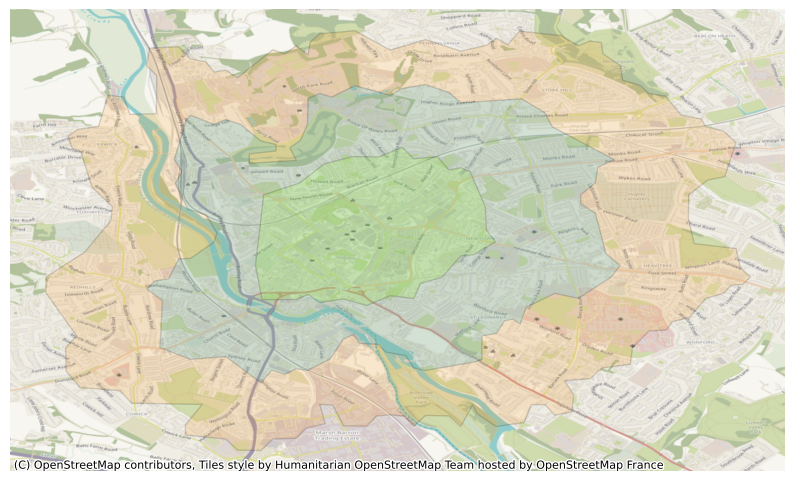

In [7]:
# multimodal is effectively a mix of pedestrian + transit
# I believe transit data comes from the gtfs service (general transit feed specification)
# some detail about what gtfs data is held for the uk can be found here: https://gtfs.pro/en/uk
# gtfs is a google project - don't know if it's what powers google map's transit services (at least partly) or not


get_isochrone(
    long_lat_pair= [-3.5280937949744335,50.72494617349739],
    profile="multimodal",
    basemap_zoom=15
    )

### Look at options relating to public transit

API suggests we can set preference for bus vs rail and how willing users are to make use of transfers.

https://valhalla.github.io/valhalla/api/turn-by-turn/api-reference/#transit-costing-options

We can set the parameter 'dry run' to see what will be send to the API and check that the formatting matches the examples given in the docs.

In [8]:
valhalla_api.isochrones(
        locations=[-3.5127907292783873,50.72593717697725],
        profile="multimodal",
        intervals=[10*60,20*60,30*60],
        options={"use_bus": 0.0, "use_rail": 1.0,"use_transfers":0.3},
        dry_run=True
    )


url:
https://valhalla1.openstreetmap.de/isochrone
Parameters:
{
  "headers": {
    "User-Agent": "routingpy/v1.2.1",
    "Content-Type": "application/json"
  },
  "timeout": 60,
  "json": {
    "locations": [
      {
        "lon": -3.5127907292783873,
        "lat": 50.72593717697725
      }
    ],
    "costing": "multimodal",
    "contours": [
      {
        "time": 10.0
      },
      {
        "time": 20.0
      },
      {
        "time": 30.0
      }
    ],
    "costing_options": {
      "transit": {
        "use_bus": 0.0,
        "use_rail": 1.0,
        "use_transfers": 0.3
      }
    }
  }
}


Isochrones(None, None)

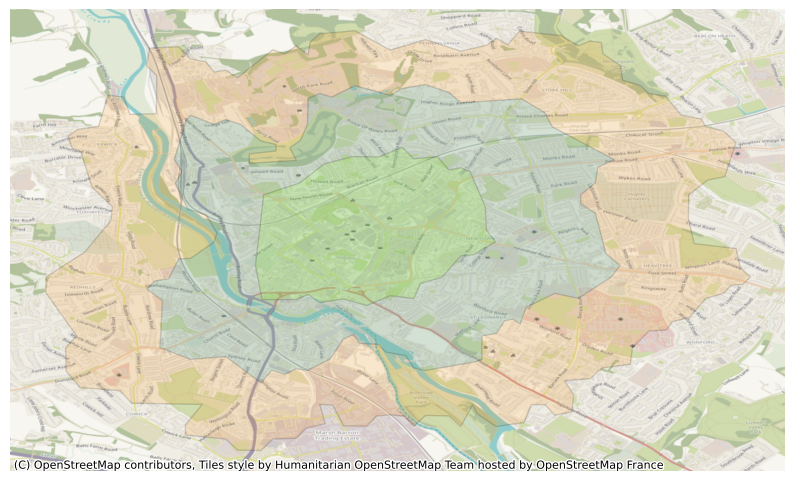

In [9]:
# Let's look at preferring bus usage

get_isochrone(
    long_lat_pair= [-3.5280937949744335,50.72494617349739],
    profile="multimodal",
    basemap_zoom=15,
    options_dict={"use_bus": "1.0", "use_rail": "0.0","use_transfers":"0.3"}
    )

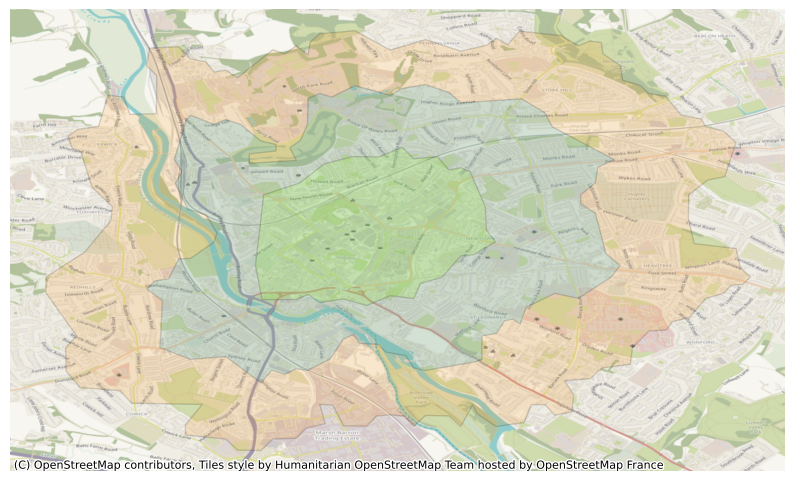

In [10]:
# Now at preferring rail usage

get_isochrone(
    long_lat_pair= [-3.5280937949744335,50.72494617349739],
    profile="multimodal",
    basemap_zoom=15,
    options_dict={"use_bus": "0.0", "use_rail": "1.0","use_transfers":"0.3"}
    )

We can see that the output is no different. My theory is that current gtfs data for the uk
does not include rail data. Downloading the geojson from this page and overlaying it in QGIS
with the google maps hybrid map shows stops only on bus stops, not train stations. 
https://gtfs.pro/en/uk/Department-for-Transport-UK/dft-gtfs


More investigation needed!

Trying it again in European countries still doesn't seem to yield different results - but uncertain which do and don't have rail data in this form.

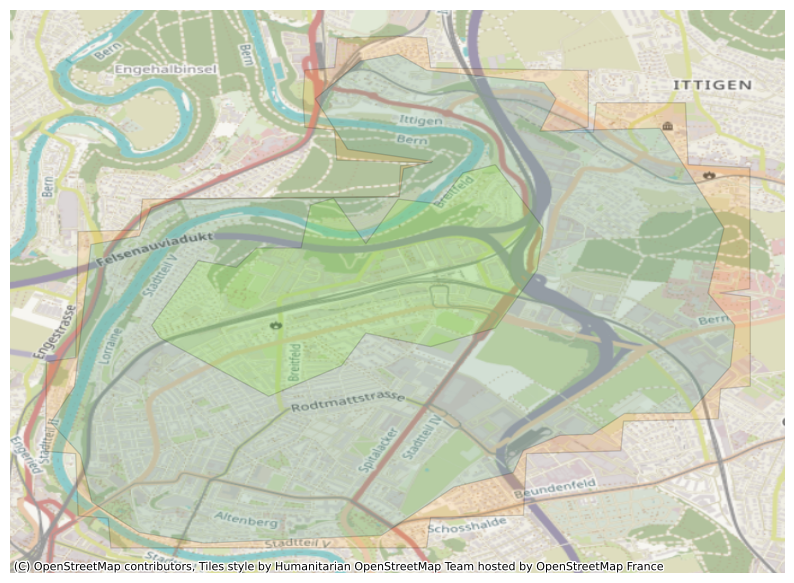

In [11]:
get_isochrone(
    long_lat_pair= [7.458000835300172, 46.96831183806674],
    profile="multimodal",
    basemap_zoom=14,
    intervals=[15*60,30*60,45*60],
    options_dict={"use_bus": "0.0", "use_rail": "1.0"}
    )


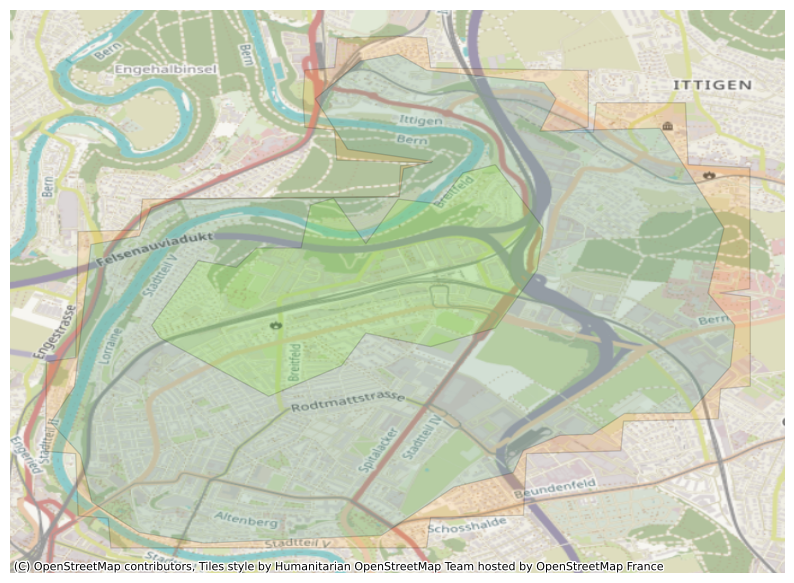

In [12]:
get_isochrone(
    long_lat_pair= [7.458000835300172, 46.96831183806674],
    profile="multimodal",
    basemap_zoom=14,
    intervals=[15*60,30*60,45*60],
    options_dict={"use_bus": "1.0", "use_rail": "0.0"}
    )


## Impact of walking speed

We can see that changing the walking speed does have an impact on the results, so the options dict is definitely working.

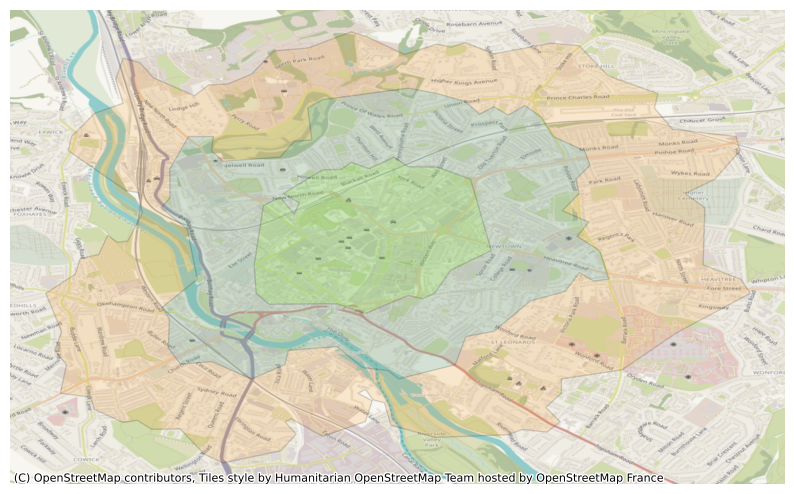

In [13]:
get_isochrone(
    long_lat_pair= [-3.5280937949744335,50.72494617349739],
    profile="pedestrian",
    basemap_zoom=15,
    options_dict={"walking_speed": "4.1"}
    )

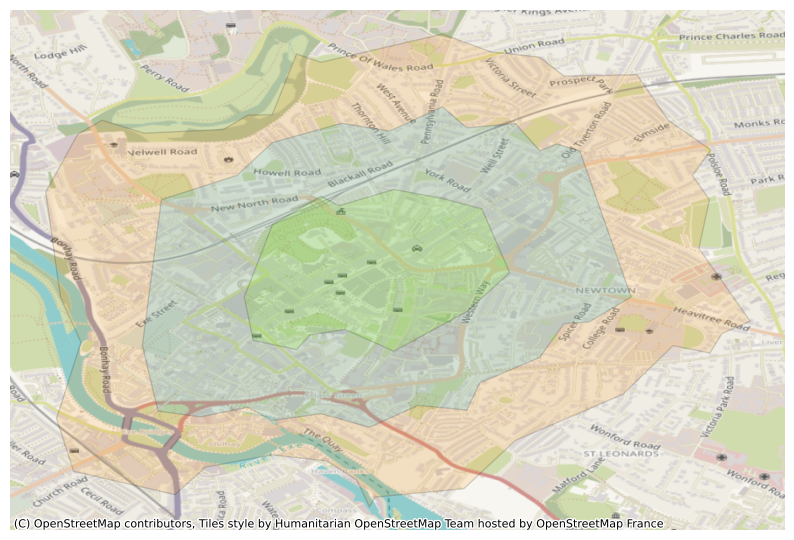

In [14]:
get_isochrone(
    long_lat_pair= [-3.5280937949744335,50.72494617349739],
    profile="pedestrian",
    basemap_zoom=15,
    options_dict={"walking_speed": "2.5"}
    )

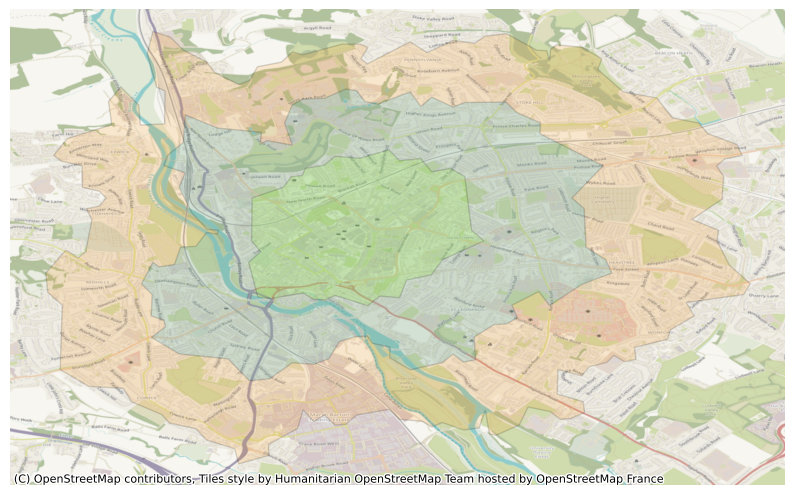

In [15]:
get_isochrone(
    long_lat_pair= [-3.5280937949744335,50.72494617349739],
    profile="pedestrian",
    basemap_zoom=15,
    options_dict={"walking_speed": "5.5"}
    )

Experiment with impact of changing how comfortable users are with using cycle lanes vs on-road

https://valhalla.github.io/valhalla/api/turn-by-turn/api-reference/#bicycle-costing-options

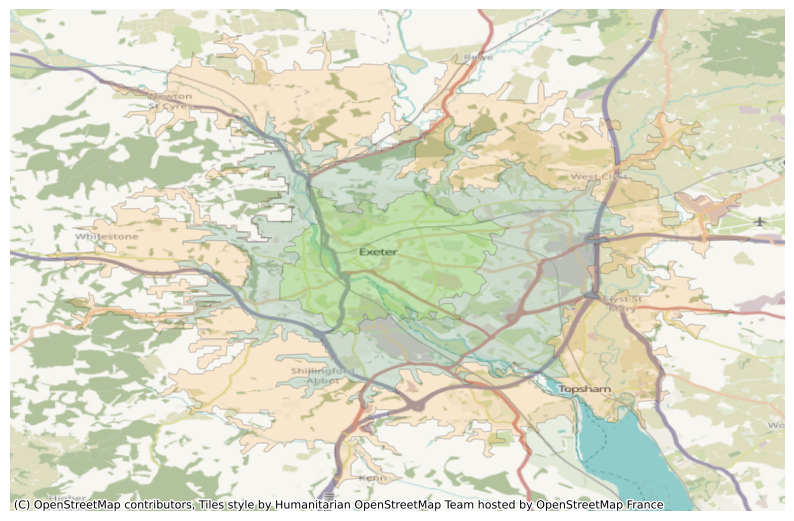

In [16]:
get_isochrone(
    long_lat_pair= [-3.5280937949744335,50.72494617349739],
    profile="bicycle",
    basemap_zoom=12,
    options_dict={"use_roads":"1.0"}
    )

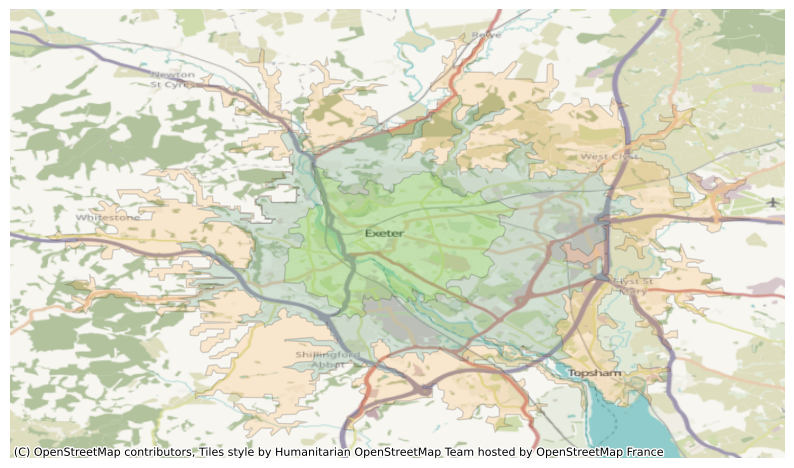

In [17]:
get_isochrone(
    long_lat_pair= [-3.5280937949744335,50.72494617349739],
    profile="bicycle",
    basemap_zoom=12,
    options_dict={"use_roads":"0.1"}
    )

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=6c661ea7-9b58-4649-92ed-c2a834b4f69c' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>